<a href="https://colab.research.google.com/github/AlketaAlia123/Computer_Vision_Exercises/blob/main/Exercise_1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Module 1: IMAGE PREPROCESSING

# New section

Module 1: Image Preprocessing
Christian Mata, PhD

# Exercise 1

**Before starting:**

- Create a GitHub repository to upload the solution of this exercise.
- Share this GitHub link to your professor.

**Objectives**

Generate a single Python notebook implementing and answering the following questions:

**- Task 1:** Load the built-in image 'coffee' of the skimage libraries. Details can be found at https://scikit-image.org/docs/stable/auto_examples/data/plot_general.html#sphx-glr-auto-examples-data-plot-general-py

**- Task 2:** Use the skimage function random_noise to add each of the 7 different types of noise available and generate a 4x2 panel figure with the original image and the 7 corrupted versions. The noise types are:

* ‘gaussian’ Gaussian-distributed additive noise.
* ‘localvar’ Gaussian-distributed additive noise, with specified
local variance at each point of image.
* ‘poisson’ Poisson-distributed noise generated from the data.
* ‘salt’ Replaces random pixels with 1.
* ‘pepper’ Replaces random pixels with 0 (for unsigned images) or
-1 (for signed images).
* ‘s&p’ Replaces random pixels with either 1 or low_val, where
low_val is 0 for unsigned images or -1 for signed images.
* ‘speckle’ Multiplicative noise using out = image + n*image, where
n is Gaussian noise with specified mean & variance.

Documentation of the function can be found at
https://scikit-image.org/docs/stable/api/skimage.util.html#skimage.util.random_noise

**- Task 3:** Select one of the noise types and generate 3 noisy images with different noise intensity levels. Represent the original image along with them in a 2x2 figure.

**- Task 4: **The standard deviation for Gaussian kernel affects the behavior of the gaussian filter (parameter sigma, see documentation https://scikit-image.org/docs/stable/api/skimage.filters.html#skimage.filters.gaussian). Explore the effect of the parameter sigma when applying a gaussian filter to the tree noisy images generated in the previus task. Represent and comment the results.

**- Task 5:** Detect the edges of the bricks in the built-in image 'bricks' using a Prewitt edge detection filter. Quantify what is the fraction of the image corresponding to bricks and to edges.

**- Task 6:** Apply a high-pass filter and a low-pass filter in the frequency domain to the skimage built-in image 'grass'. Represent the results and discuss the correspondance between spatial patterns in the original image and high/low frequency components of its the Fourier transform.

**- Task 7:** Use the function binary_blobs to generate an image with random blobs: https://scikit-image.org/docs/stable/api/skimage.data.html#skimage.data.binary_blobs
How many consecutive morphological erosions are needed in order to remove all the blobs? Use a disk-shaped structuring element of radius 3 pixels (footprint). https://scikit-image.org/docs/stable/api/skimage.morphology.html#skimage.morphology.disk




**SOLUTION OF TASK 1 AND TASK 2**

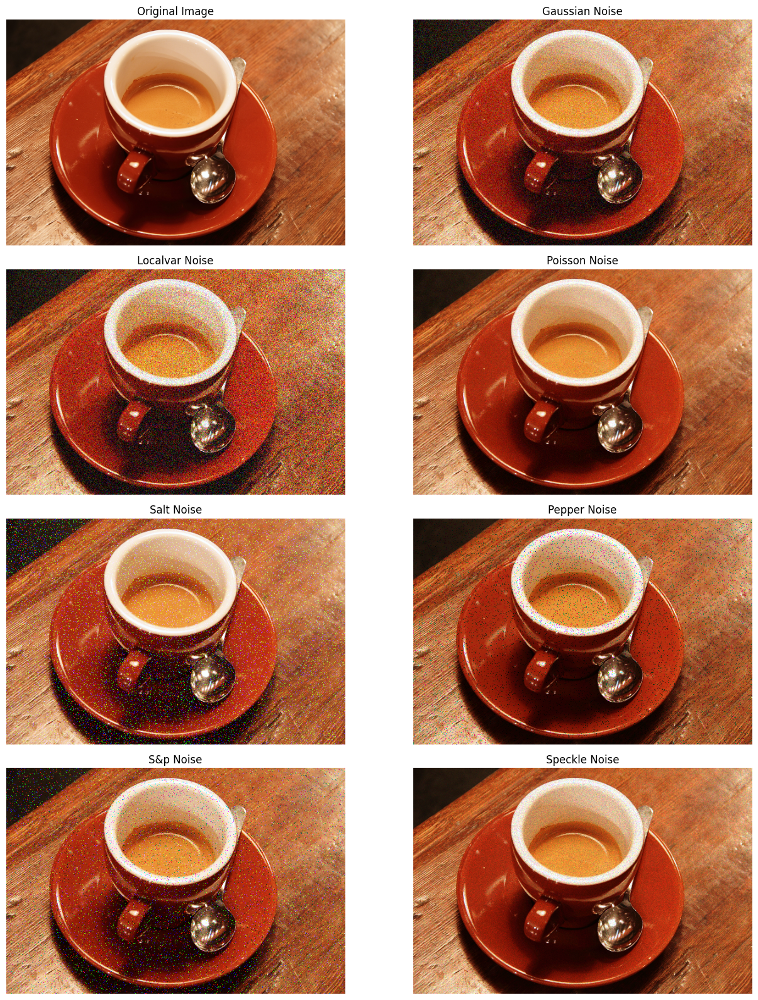

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from skimage import data
from skimage.util import random_noise

# Task 1: Load the built-in image 'coffee'
coffee_img = data.coffee()

# Task 2: Create a 4x2 panel with original and 7 noisy versions
# Define all noise types
noise_types = ['gaussian', 'localvar', 'poisson', 'salt', 'pepper', 's&p', 'speckle']

# Create figure with 4x2 subplots
fig, axes = plt.subplots(nrows=4, ncols=2, figsize=(14, 16),
                         sharex=True, sharey=True)

# First subplot: original image
axes[0, 0].imshow(coffee_img)
axes[0, 0].set_title('Original Image')
axes[0, 0].axis('off')

# For localvar noise, we need to provide the local variance
# Creating an artificial local variance image with gradual change
rows, cols, channels = coffee_img.shape
localvar_img = np.zeros_like(coffee_img, dtype=float)

# Create a gradient for the variance - repeat for each channel
for i in range(channels):
    localvar_img[:, :, i] = np.linspace(0.01, 0.05, cols)

# Apply different noise types to the image
for i, noise_type in enumerate(noise_types):
    # Calculate row and column index
    row_idx = (i + 1) // 2  # integer division
    col_idx = (i + 1) % 2

    # Generate noisy image
    if noise_type == 'localvar':
        noisy_img = random_noise(coffee_img, mode=noise_type, local_vars=localvar_img)
    else:
        noisy_img = random_noise(coffee_img, mode=noise_type)

    # Display the noisy image
    axes[row_idx, col_idx].imshow(noisy_img)
    axes[row_idx, col_idx].set_title(f'{noise_type.capitalize()} Noise')
    axes[row_idx, col_idx].axis('off')

plt.tight_layout()
plt.show()

**SOLUTION OF TASK 3**


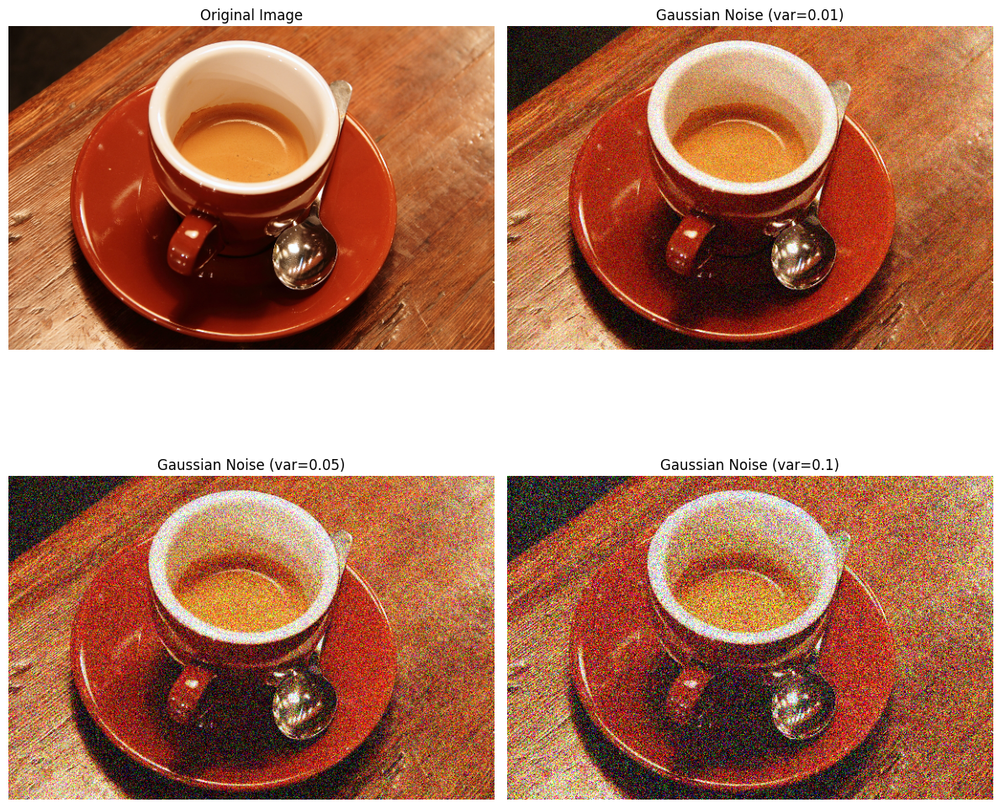

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from skimage import data
from skimage.util import random_noise

# Load the coffee image
coffee_img = data.coffee()

# Select one noise type: gaussian
noise_type = 'gaussian'

# Define different noise intensity levels (variance values)
noise_levels = [0.01, 0.05, 0.1]  # Low, medium, high noise

# Create a 2x2 figure
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(12, 12),
                         sharex=True, sharey=True)

# First subplot: original image
axes[0, 0].imshow(coffee_img)
axes[0, 0].set_title('Original Image')
axes[0, 0].axis('off')

# Apply different noise levels
for i, level in enumerate(noise_levels):
    # Calculate row and column index
    row_idx = (i + 1) // 2
    col_idx = (i + 1) % 2

    # Generate noisy image with specified variance (noise intensity)
    noisy_img = random_noise(coffee_img, mode=noise_type, var=level)

    # Display the noisy image
    axes[row_idx, col_idx].imshow(noisy_img)
    axes[row_idx, col_idx].set_title(f'{noise_type.capitalize()} Noise (var={level})')
    axes[row_idx, col_idx].axis('off')

plt.tight_layout()
plt.show()

**SOLUTION OF TASK 4**

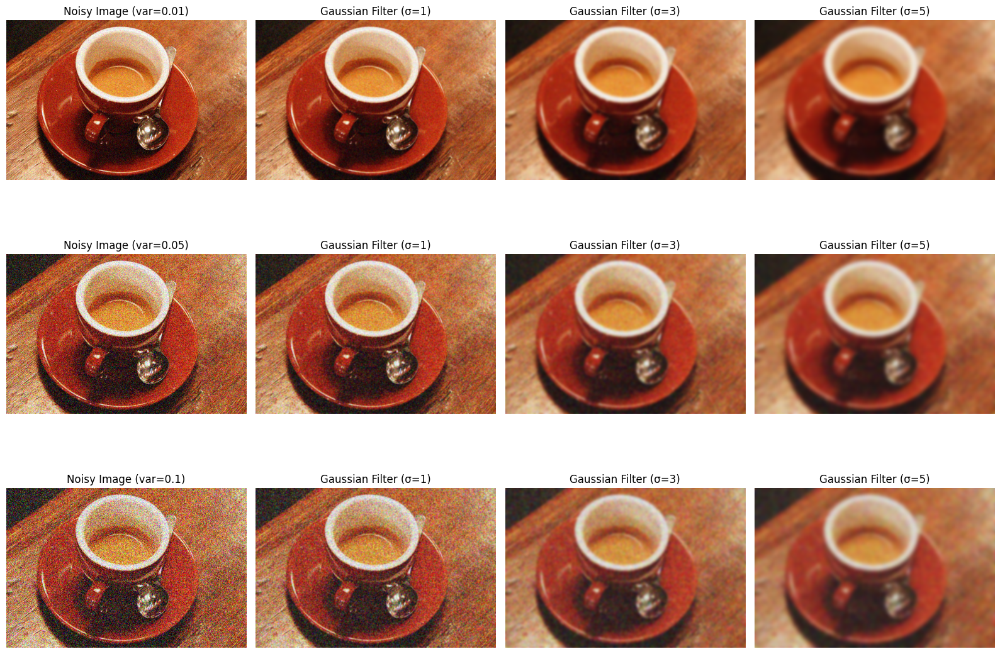

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from skimage import data
from skimage.util import random_noise
from skimage.filters import gaussian

# Load the coffee image
coffee_img = data.coffee()

# Select one noise type: gaussian
noise_type = 'gaussian'

# Define different noise intensity levels (variance values)
noise_levels = [0.01, 0.05, 0.1]  # Low, medium, high noise

# Generate the three noisy images from Task 3
noisy_images = []
for level in noise_levels:
    noisy_img = random_noise(coffee_img, mode=noise_type, var=level)
    noisy_images.append(noisy_img)

# Define different sigma values for Gaussian filtering
sigma_values = [1, 3, 5]

# Create a figure with rows for each noisy image and columns for different sigma values
fig, axes = plt.subplots(nrows=len(noisy_images), ncols=len(sigma_values)+1,
                        figsize=(16, 12), sharex=True, sharey=True)

# For each noisy image (row)
for i, noisy_img in enumerate(noisy_images):
    # First column shows the noisy image without filtering
    axes[i, 0].imshow(noisy_img)
    axes[i, 0].set_title(f'Noisy Image (var={noise_levels[i]})')
    axes[i, 0].axis('off')

    # Apply Gaussian filters with different sigma values
    for j, sigma in enumerate(sigma_values):
        # Apply Gaussian filter
        filtered_img = gaussian(noisy_img, sigma=sigma, channel_axis=-1)

        # Display the filtered image
        axes[i, j+1].imshow(filtered_img)
        axes[i, j+1].set_title(f'Gaussian Filter (σ={sigma})')
        axes[i, j+1].axis('off')

plt.tight_layout()

**TASK 4 EXPLANATION OF THE RESULTS:**
Analysis of Gaussian Filter Application on Noisy Coffee Images
Based on the results shown in the image grid, we can observe the effects of applying Gaussian filters with different sigma values (σ=1, 3, and 5) to coffee images corrupted with varying levels of Gaussian noise (var=0.01, 0.05, and 0.1).
Observations by Noise Level
Low Noise (var=0.01)

The original noisy image shows minimal visible noise
With σ=1, most of the noise is removed while preserving fine details like the texture in the coffee and the wood grain
With σ=3, there's noticeably more smoothing, slightly blurring the edges of the cup and saucer
With σ=5, significant blurring occurs, with loss of fine details in the coffee texture and wood surface

Medium Noise (var=0.05)

The noisy image shows clearly visible grain, particularly in darker regions
With σ=1, some noise reduction occurs but significant noise remains
With σ=3, most noise is eliminated, but with moderate loss of detail
With σ=5, the image is very smooth but with considerable loss of texture and edge sharpness

High Noise (var=0.1)

The original image is heavily corrupted with prominent noise artifacts
With σ=1, noise reduction is insufficient, with substantial noise still visible
With σ=3, noise is significantly reduced but some remains visible, particularly in darker areas
With σ=5, most noise is eliminated, but at the cost of substantial detail loss and edge blurring

Key Insights

Sigma vs. Noise Level Relationship: As noise level increases, a larger sigma value becomes necessary for effective noise reduction. For low noise levels (var=0.01), σ=1 is sufficient, while for high noise (var=0.1), a sigma of 3 or 5 is needed.
Detail Preservation Trade-off: There's an inverse relationship between noise reduction and detail preservation. Larger sigma values eliminate more noise but also blur important image details.
Optimal Filtering Parameters: The "best" sigma value depends on the specific application:

For images with minimal noise (var=0.01), σ=1 provides good noise reduction while preserving most details
For moderate noise (var=0.05), σ=3 offers a good balance
For heavy noise (var=0.1), σ=5 may be necessary, accepting the loss of some detail


Edge Preservation: The Gaussian filter does not preserve edges well at higher sigma values. This is evident in the blurring of the cup edges and spoon details with σ=5, suggesting that edge-preserving filters like bilateral or median filters might be more appropriate for applications where edge preservation is critical.

In conclusion, the Gaussian filter demonstrates its effectiveness as a noise reduction technique, but the selection of the sigma parameter should be carefully considered based on the noise level and the importance of preserving fine details in the specific application.


**SOLUTION OF TASK 5**

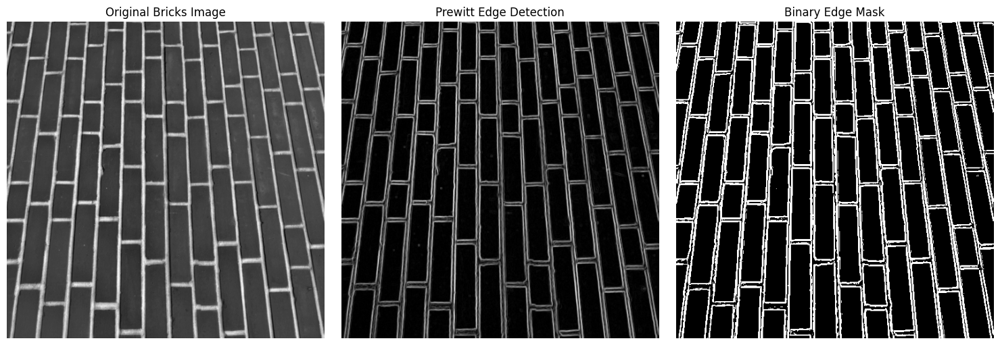

Total pixels in the image: 262144
Pixels corresponding to edges: 55487 (21.17%)
Pixels corresponding to bricks: 206657 (78.83%)


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from skimage import data
from skimage.filters import prewitt
from skimage import filters

# Load the bricks image
bricks = data.brick()

# Apply Prewitt filter for edge detection
edges_prewitt = prewitt(bricks)

# Threshold the edge image to create a binary edge mask
# We need to find an appropriate threshold value
thresh = filters.threshold_otsu(edges_prewitt)
binary_edges = edges_prewitt > thresh

# Create a figure to display the results
fig, axes = plt.subplots(1, 3, figsize=(15, 5))

# Original image
axes[0].imshow(bricks, cmap='gray')
axes[0].set_title('Original Bricks Image')
axes[0].axis('off')

# Prewitt edge detection result
axes[1].imshow(edges_prewitt, cmap='gray')
axes[1].set_title('Prewitt Edge Detection')
axes[1].axis('off')

# Binary edge mask
axes[2].imshow(binary_edges, cmap='gray')
axes[2].set_title('Binary Edge Mask')
axes[2].axis('off')

plt.tight_layout()
plt.show()

# Quantify the fraction of the image corresponding to edges and bricks
total_pixels = binary_edges.size
edge_pixels = np.sum(binary_edges)
brick_pixels = total_pixels - edge_pixels

edge_fraction = edge_pixels / total_pixels
brick_fraction = brick_pixels / total_pixels

print(f"Total pixels in the image: {total_pixels}")
print(f"Pixels corresponding to edges: {edge_pixels} ({edge_fraction:.2%})")
print(f"Pixels corresponding to bricks: {brick_pixels} ({brick_fraction:.2%})")

**SOLUTION OF TASK 6**

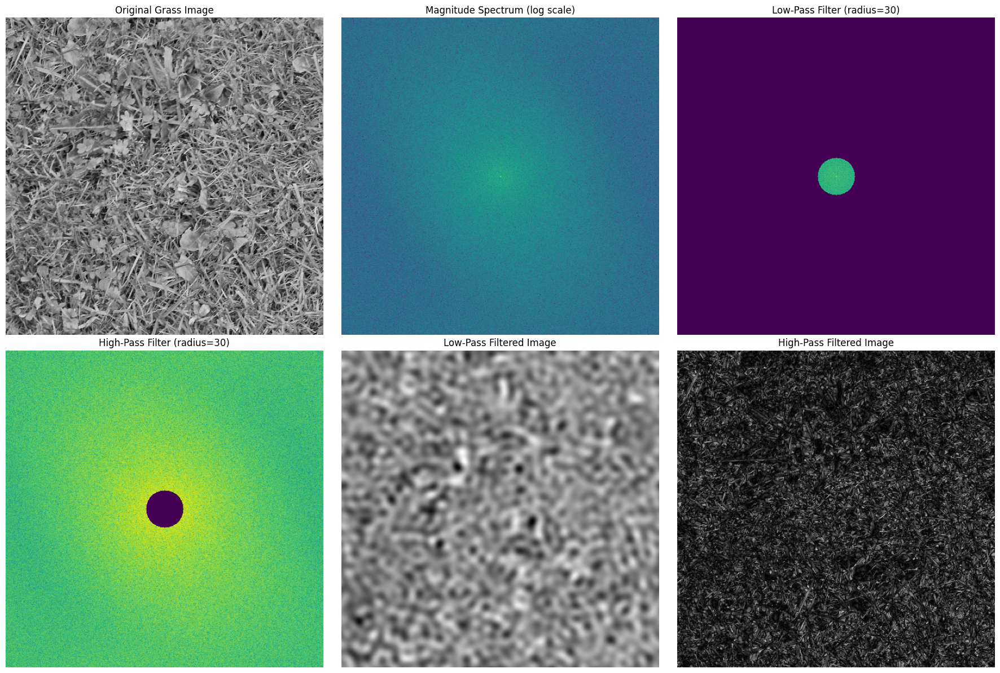

Percentage of information in low frequencies: 8.49%
Percentage of information in high frequencies: 91.51%


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from skimage import data
from matplotlib.colors import LogNorm

# Load the grass image (it's already grayscale)
grass_gray = data.grass()

# Calculate the 2D FFT of the image
f = np.fft.fft2(grass_gray)
fshift = np.fft.fftshift(f)  # Shift the zero-frequency component to the center

# Calculate the magnitude spectrum (log scale for better visualization)
magnitude_spectrum = np.abs(fshift)

# Create high-pass and low-pass filters
rows, cols = grass_gray.shape
crow, ccol = rows // 2, cols // 2  # Center coordinates
radius_low = 30  # Cutoff radius for low-pass filter
radius_high = 30  # Cutoff radius for high-pass filter

# Create a meshgrid for filter calculation
y, x = np.ogrid[:rows, :cols]
dist_from_center = np.sqrt((x - ccol)**2 + (y - crow)**2)

# Create masks for the filters
low_pass_mask = dist_from_center <= radius_low
high_pass_mask = dist_from_center > radius_high

# Apply the filters in frequency domain
fshift_low_pass = fshift.copy()
fshift_low_pass[~low_pass_mask] = 0  # Keep only low frequencies

fshift_high_pass = fshift.copy()
fshift_high_pass[low_pass_mask] = 0  # Keep only high frequencies

# Inverse FFT to get filtered images
f_ishift_low = np.fft.ifftshift(fshift_low_pass)
img_low = np.fft.ifft2(f_ishift_low)
img_low = np.abs(img_low)

f_ishift_high = np.fft.ifftshift(fshift_high_pass)
img_high = np.fft.ifft2(f_ishift_high)
img_high = np.abs(img_high)

# Create a figure to display results
fig, axes = plt.subplots(2, 3, figsize=(18, 12))

# Original image and its spectrum
axes[0, 0].imshow(grass_gray, cmap='gray')
axes[0, 0].set_title('Original Grass Image')
axes[0, 0].axis('off')

axes[0, 1].imshow(np.log1p(magnitude_spectrum), cmap='viridis')
axes[0, 1].set_title('Magnitude Spectrum (log scale)')
axes[0, 1].axis('off')

# Low-pass filter visualization
lpf_spectrum = magnitude_spectrum.copy()
lpf_spectrum[~low_pass_mask] = 0
axes[0, 2].imshow(np.log1p(lpf_spectrum), cmap='viridis')
axes[0, 2].set_title('Low-Pass Filter (radius={})'.format(radius_low))
axes[0, 2].axis('off')

# High-pass filter visualization
hpf_spectrum = magnitude_spectrum.copy()
hpf_spectrum[low_pass_mask] = 0
axes[1, 0].imshow(np.log1p(hpf_spectrum), cmap='viridis')
axes[1, 0].set_title('High-Pass Filter (radius={})'.format(radius_high))
axes[1, 0].axis('off')

# Low-pass and high-pass filtered images
axes[1, 1].imshow(img_low, cmap='gray')
axes[1, 1].set_title('Low-Pass Filtered Image')
axes[1, 1].axis('off')

axes[1, 2].imshow(img_high, cmap='gray')
axes[1, 2].set_title('High-Pass Filtered Image')
axes[1, 2].axis('off')

plt.tight_layout()
plt.show()

# Calculate the percentage of information in low vs high frequencies
# (based on magnitude of Fourier coefficients)
total_magnitude = np.sum(np.abs(fshift))
low_freq_magnitude = np.sum(np.abs(fshift)[low_pass_mask])
high_freq_magnitude = np.sum(np.abs(fshift)[~low_pass_mask])

low_freq_percentage = (low_freq_magnitude / total_magnitude) * 100
high_freq_percentage = (high_freq_magnitude / total_magnitude) * 100

print(f"Percentage of information in low frequencies: {low_freq_percentage:.2f}%")
print(f"Percentage of information in high frequencies: {high_freq_percentage:.2f}%")

**TASK 6 EXPLANATION OF THE RESULTS:**
Analysis of Frequency Domain Filtering on the Grass Image
Correspondence Between Spatial Patterns and Frequency Components
The results demonstrate the fundamental relationship between spatial patterns in the original grass image and their representation in the frequency domain through the Fourier transform.
Original Grass Image and Its Frequency Spectrum
The original grass image shows a complex natural texture with numerous overlapping grass blades creating a dense pattern with high detail. Looking at the corresponding magnitude spectrum (top middle), we observe:

Brightness at the center: The bright spot at the center of the spectrum represents the DC component (zero frequency), which corresponds to the average brightness of the image.
Diffuse brightness pattern: The spectrum shows a somewhat diffuse pattern extending from the center, indicating that the grass image contains frequency components across a wide range of frequencies, without strong directional bias.
Higher intensity near the center: The intensity decreases as we move away from the center, showing that lower frequencies (representing broader patterns) carry more energy than higher frequencies (representing fine details).

Low-Pass Filtering
The low-pass filter (radius=30) isolates the central portion of the frequency spectrum, retaining only low-frequency components. The resulting filtered image (middle bottom) reveals:

Loss of detail: The sharp edges and fine texture of individual grass blades are completely lost.
Blurry appearance: Only broad, smooth variations in intensity remain, showing general light and dark regions.
Preserved large-scale structure: The overall distribution of lighter and darker areas is maintained, corresponding to the general arrangement of grass patches.

This demonstrates that low frequencies in the grass image correspond to the overall structure and gradual variations in brightness across larger regions, but not to the detailed texture that makes grass recognizable.
High-Pass Filtering
The high-pass filter excludes the central portion of the frequency spectrum, retaining only high-frequency components. The resulting filtered image (bottom right) shows:

Enhanced edges and details: The fine structure of individual grass blades is preserved and even emphasized.
Reduced overall brightness: The image appears darker overall because the DC component (average brightness) has been removed.
Texture preservation: The complex texture pattern of overlapping grass strands is clearly visible.
Edge highlighting: Transitions between different grass blades are emphasized, creating a more detailed appearance.

This confirms that high frequencies in the grass image correspond to the fine details, sharp transitions, and textural elements that give grass its characteristic appearance.
Spatial-Frequency Relationship Insights

Texture and Scale: The grass image is rich in multi-scale texture elements. The larger-scale variations (general grass patch distribution) are captured by low frequencies, while the fine details of individual grass blades are represented by high frequencies.
Natural Textures and Frequency Distribution: The grass's natural texture contains information across the entire frequency spectrum. The somewhat uniform distribution in the magnitude spectrum (without strong directional patterns) suggests that the grass texture has a fairly isotropic structure without strong directional preference.
Information Distribution: While the high-pass filtered image retains more of the recognizable textural characteristics of grass, the low-pass filtered image preserves the overall brightness distribution. This illustrates how different frequency bands carry different aspects of visual information.
Edge Information: The sharp boundaries between adjacent grass blades create high-frequency components in the Fourier transform. When these are isolated in the high-pass filtered image, we can see how crucial they are to our perception of the texture's detail.

The frequency domain analysis of the grass image demonstrates the complementary nature of low and high-frequency components in natural textures. Low frequencies carry information about broad patterns and overall brightness distribution, while high frequencies encode fine details, edges, and the distinctive textural elements that make grass recognizable as grass. This fundamental relationship between spatial patterns and frequency components forms the basis for many image processing techniques, including compression, enhancement, and feature extraction.

**SOLUTION OF TASK 7**

Created blobs without specifying random seed


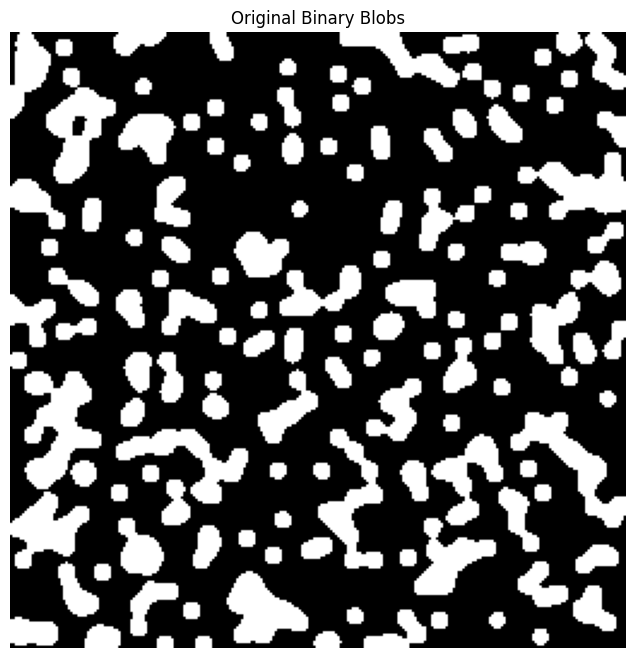

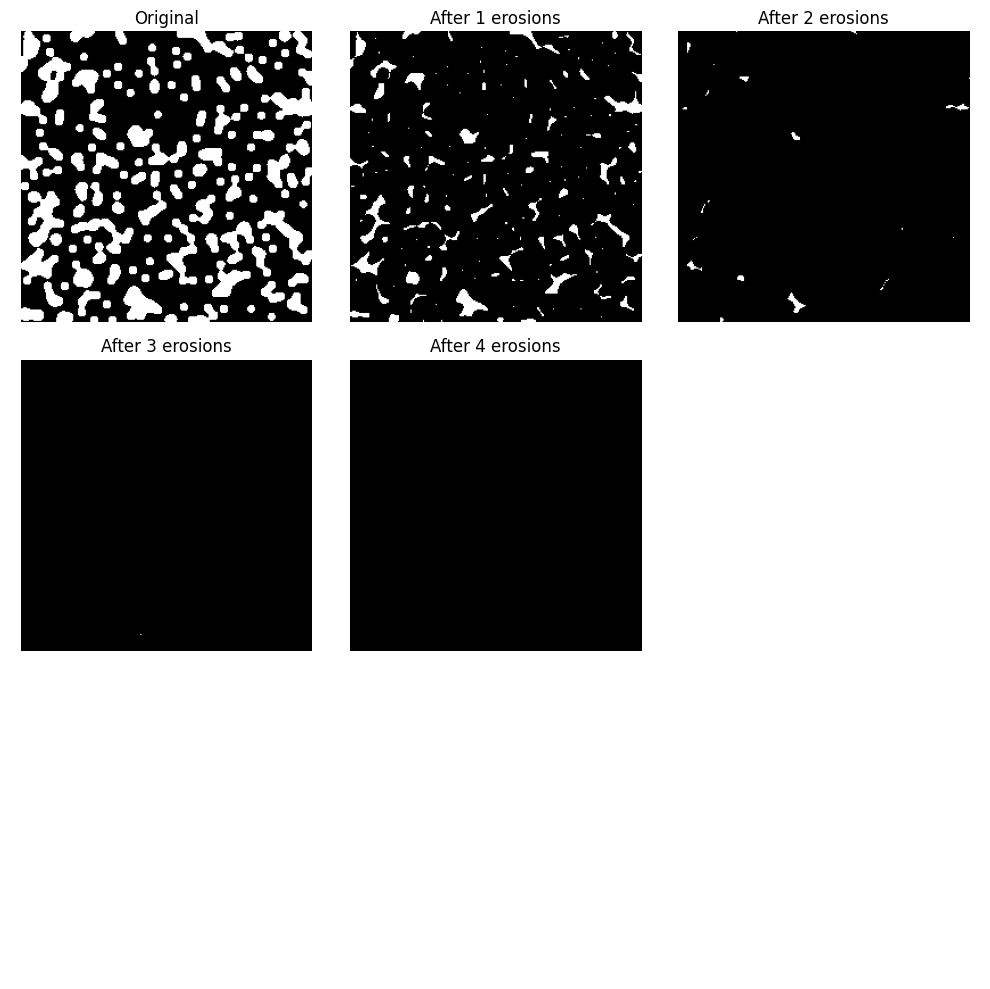

Number of consecutive erosions needed to remove all blobs: 4


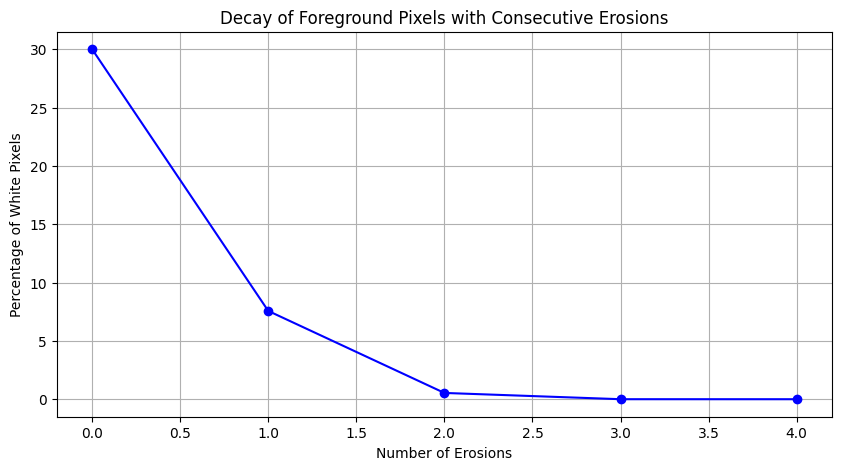

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from skimage.morphology import erosion, disk
from skimage.data import binary_blobs

# Generate a binary image with random blobs
# Check the documentation for the correct parameter
try:
    # Try with random_state (newer versions)
    blob_image = binary_blobs(length=256, blob_size_fraction=0.05,
                              n_dim=2, volume_fraction=0.3, random_state=1)
except TypeError:
    try:
        # Try with seed (older versions)
        blob_image = binary_blobs(length=256, blob_size_fraction=0.05,
                                  n_dim=2, volume_fraction=0.3, seed=1)
    except TypeError:
        # Try without specifying random seed
        blob_image = binary_blobs(length=256, blob_size_fraction=0.05,
                                 n_dim=2, volume_fraction=0.3)
        print("Created blobs without specifying random seed")

# Create a disk-shaped structuring element with radius 3
selem = disk(3)

# Keep track of the erosion process
images = [blob_image]
current_img = blob_image.copy()

# Apply consecutive erosions until all blobs are removed
erosion_count = 0
while np.any(current_img):
    # Apply erosion
    current_img = erosion(current_img, selem)
    # Store the result
    images.append(current_img.copy())
    erosion_count += 1
    # Safety check
    if erosion_count > 50:
        print("Reached maximum iterations, stopping.")
        break

# Display the original image
plt.figure(figsize=(8, 8))
plt.imshow(blob_image, cmap='gray')
plt.title('Original Binary Blobs')
plt.axis('off')
plt.show()

# Display selected erosion steps in a grid
num_to_display = min(9, len(images))
indices = np.linspace(0, len(images) - 1, num_to_display, dtype=int)

fig, axes = plt.subplots(3, 3, figsize=(10, 10))
axes = axes.flatten()

for i, idx in enumerate(indices):
    if i < len(axes):
        axes[i].imshow(images[idx], cmap='gray')
        if idx == 0:
            axes[i].set_title('Original')
        else:
            axes[i].set_title(f'After {idx} erosions')
        axes[i].axis('off')

# Hide any unused subplots
for i in range(len(indices), len(axes)):
    axes[i].axis('off')

plt.tight_layout()
plt.show()

print(f"Number of consecutive erosions needed to remove all blobs: {erosion_count}")

# Plot the decay of white pixels over erosions
white_pixels = [np.sum(img) for img in images]
percentage_white = [count / (blob_image.shape[0] * blob_image.shape[1]) * 100 for count in white_pixels]

plt.figure(figsize=(10, 5))
plt.plot(range(len(percentage_white)), percentage_white, 'b-o')
plt.xlabel('Number of Erosions')
plt.ylabel('Percentage of White Pixels')
plt.title('Decay of Foreground Pixels with Consecutive Erosions')
plt.grid(True)
plt.show()